# Lane Detection for Self Driving Car

## Loading Test Images

In [3]:
import matplotlib.pyplot as plt
import cv2, os, glob
import numpy as np

# This is to get inline plots from Matplotlib
# in the Ipython console.
%matplotlib inline
# Retina display
%config InlineBackend.figure_format = 'retina'

print("Libraries Imported")

Libraries Imported


In [19]:
# function for displaying the images
def display_images(images):
    col = 2
    row = (len(images) + 1)//col
    
    plt.figure(figsize = (10, 11))
    for i, img in enumerate(images):
        plt.subplot(row, col, i+1)
        cmap = None
        if len(img.shape) == 2:
            cmap = 'gray'
        plt.imshow(img, cmap = cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

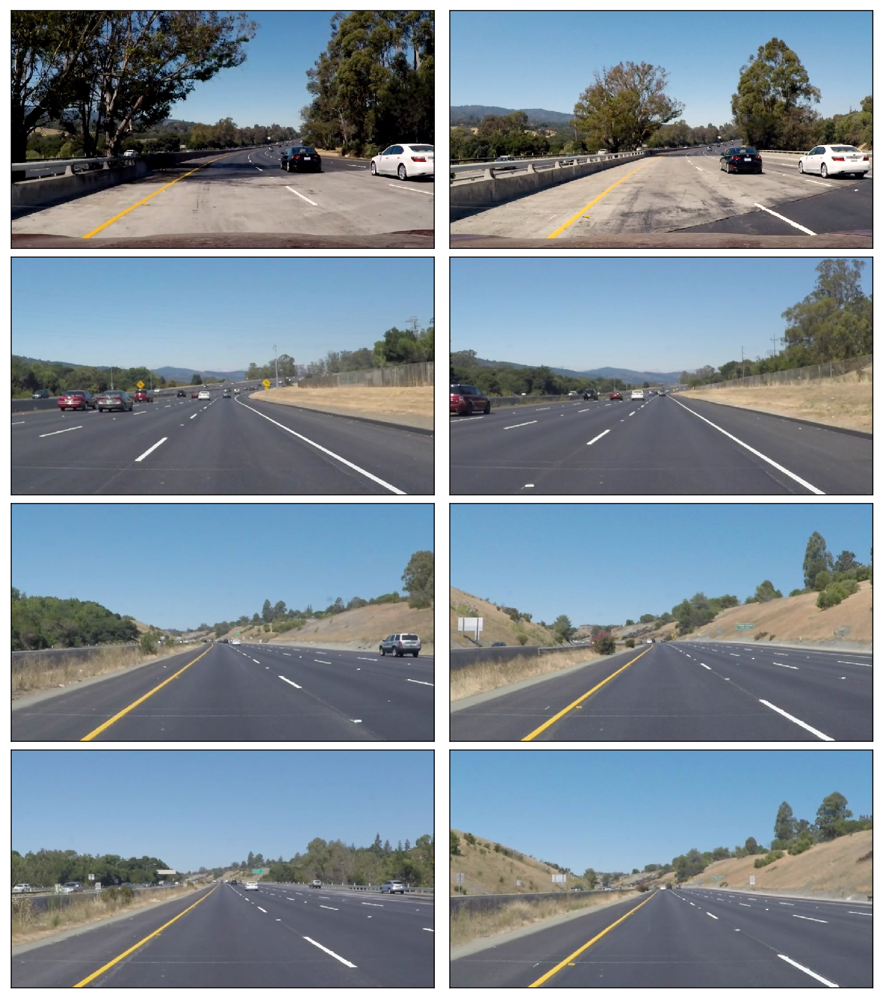

In [20]:
test_images = [plt.imread(path) for path in glob.glob('Images/*.jpg')]
display_images(test_images)

## Color Selection

#### RGB color code chart for reference: https://www.rapidtables.com/web/color/RGB_Color.html

In [21]:
# Selection of yellow and white color from RGB Image
def rgb_white_yellow(image):
    # white mask
    lower = np.uint8([200, 200, 200])
    upper = np.uint8([255, 255, 255])
    white = cv2.inRange(image, lower, upper)
    # yellow mask
    lower = np.uint8([190, 190,   0])
    upper = np.uint8([255, 255, 255])
    yellow = cv2.inRange(image, lower, upper)
    # Combining white and yellow masks
    mask = cv2.bitwise_or(white, yellow)
    filtered_image = cv2.bitwise_and(image, image, mask = mask)
    return filtered_image

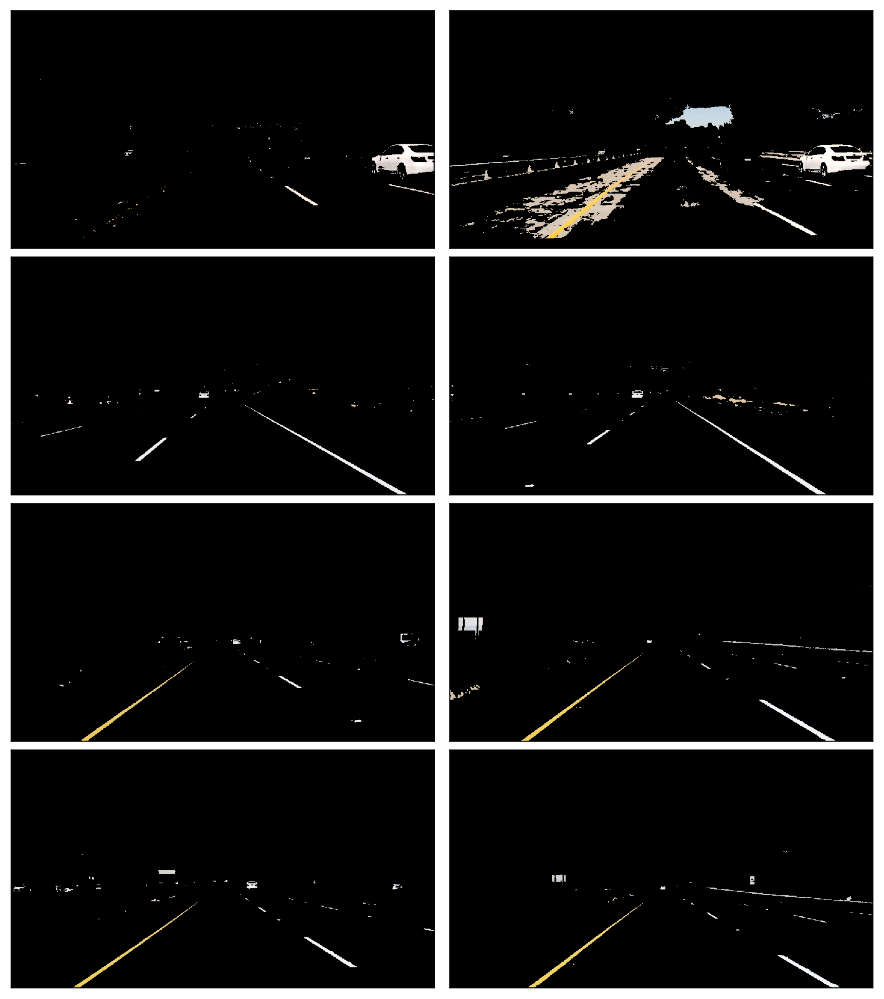

In [31]:
display_images(list(map(rgb_white_yellow, test_images)))

### Reference for HSV and HSL colorspace: https://en.wikipedia.org/wiki/HSL_and_HSV and https://commons.wikimedia.org/wiki/File:Hsl-hsv_models.svg

In [32]:
# Converting to HSV colorspace
def convertTo_hsv(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

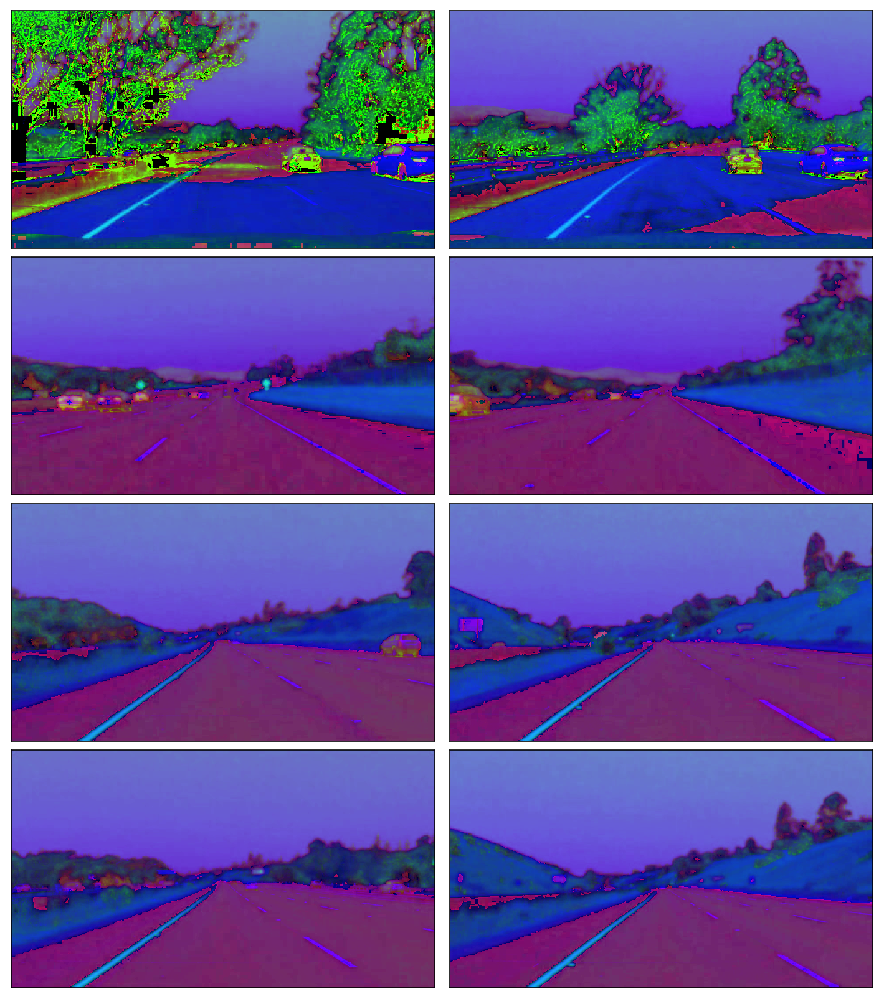

In [34]:
display_images(list(map(convertTo_hsv, test_images)))

In [40]:
# Converting to HLS colorspace
def convertTo_hls(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

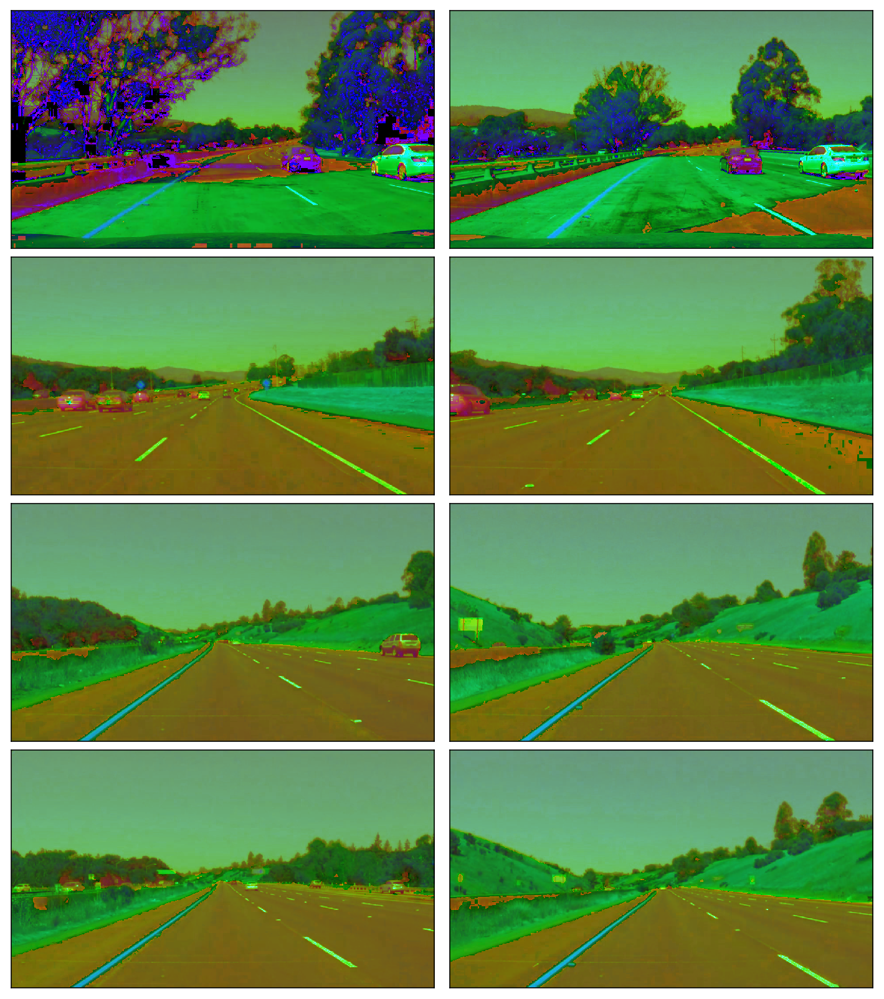

In [42]:
display_images(list(map(convertTo_hls, test_images)))

### Conclusion: Both white and yellow lines can be distinguished even through shadow

In [45]:
# Select white and yellow lines from the images in the HSL colorspace
def hsl_white_yellow(image):
    hsl = convertTo_hls(image)
    # white mask
    lower = np.uint8([  0, 200,   0])
    upper = np.uint8([255, 255, 255])
    white = cv2.inRange(hsl, lower, upper)
    # yellow mask
    lower = np.uint8([ 10,   0, 100])
    upper = np.uint8([ 40, 255, 255])
    yellow = cv2.inRange(hsl, lower, upper)
    # Combining the mask and the image
    mask = cv2.bitwise_or(white, yellow)
    filtered_image = cv2.bitwise_and(image, image, mask = mask)
    return filtered_image

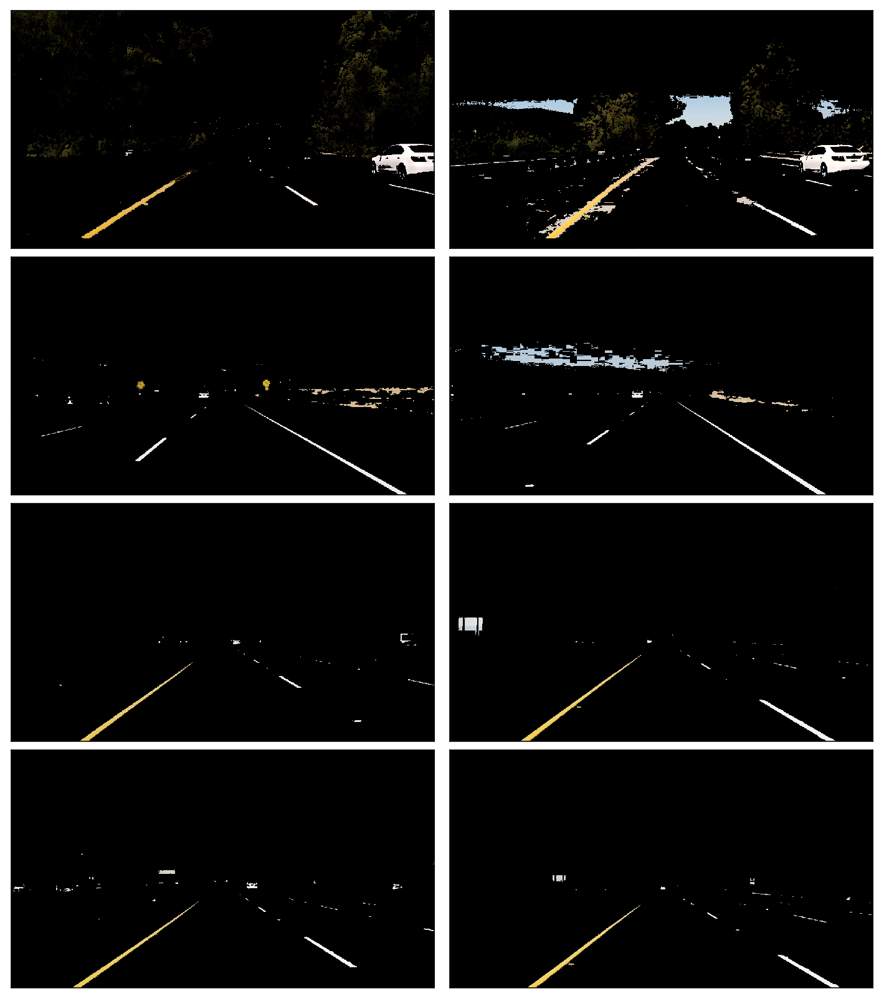

In [47]:
hsl_white_yellow_images = list(map(hsl_white_yellow, test_images))
display_images(hsl_white_yellow_images)

#### The colors for the filters were chosen by trial and error through a OpenCV TrackBar Color Palette on an Object Tracking Algorithm

## Canny Edge Detection

#### Reference for Canny Edge Detection can be found here https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_imgproc/py_canny/py_canny.html?highlight=canny

In [58]:
# Images should be converted to grayscale for Canny edge detection to work
# Moreover Grayscaling reduces the image data
# Function to convert the image to grayscale
def convertTo_gray(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

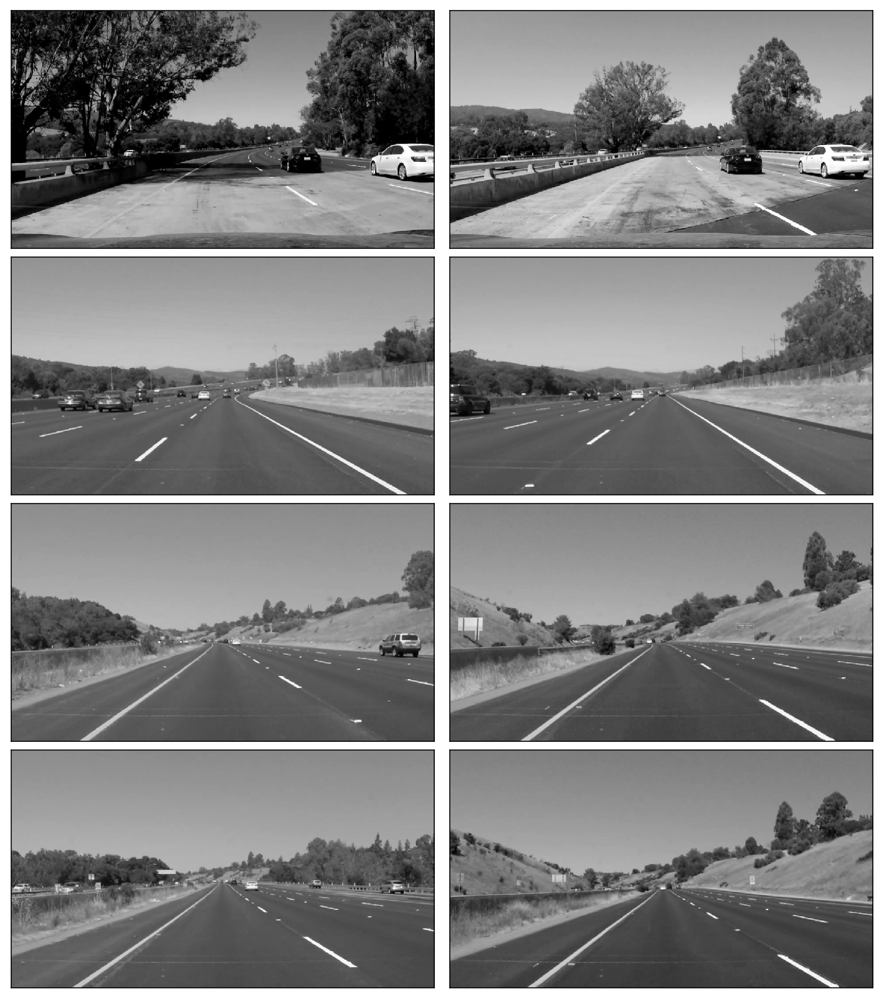

In [59]:
# Grayscaling RGB images
gray_images = list(map(convertTo_gray, test_images))
display_images(gray_images)

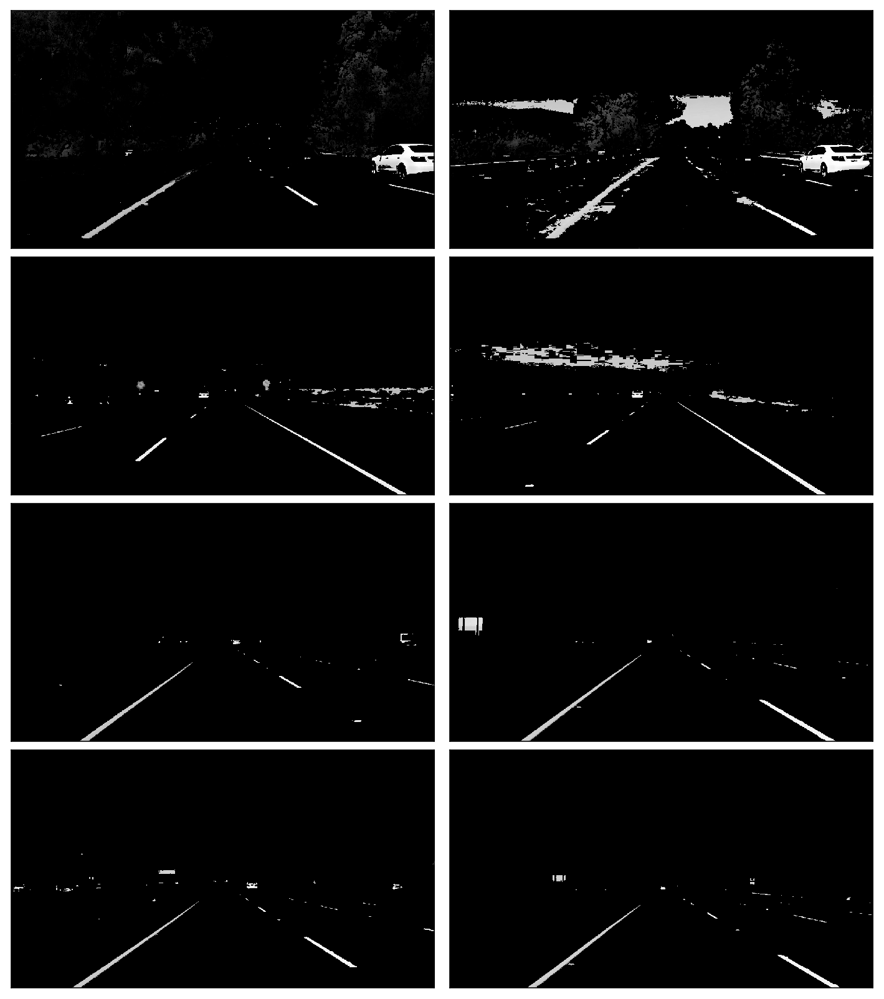

In [60]:
# Grayscaling hsl white and yellow filtered images
gray_images = list(map(convertTo_gray, hsl_white_yellow_images))
display_images(gray_images)

#### Now we need to smoothen the images to make the edges smoother and reduce the noise. Hence we apply Gaussian Blur. Reference for Gaussian Blur can be found here https://docs.opencv.org/3.1.0/d4/d13/tutorial_py_filtering.html

In [62]:
# Function to apply Gaussian Blur
def apply_gaussian_blur(image, k_size = 15):
    return cv2.GaussianBlur(image, (k_size, k_size), 0)

#### The kernel size was determined using trial and error.
#### Note: Kernel size has to be an odd positive number.
#### Reference for kernels in image processing can be fund here https://en.wikipedia.org/wiki/Kernel_(image_processing)

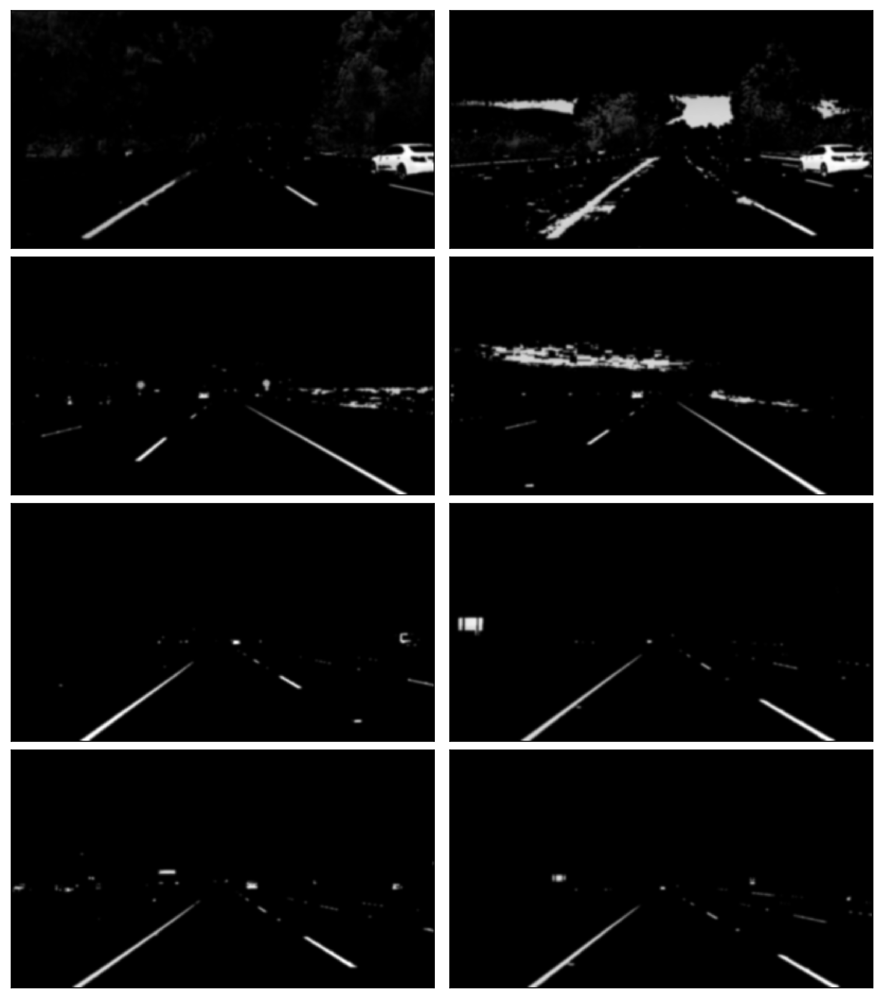

In [64]:
smooth_images = list(map(apply_gaussian_blur, gray_images))
display_images(smooth_images)

In [73]:
# Function for Canny edge detection
def edge_detection(image, low_threshold = 50, high_threshold = 150):
    return cv2.Canny(image, low_threshold, high_threshold)

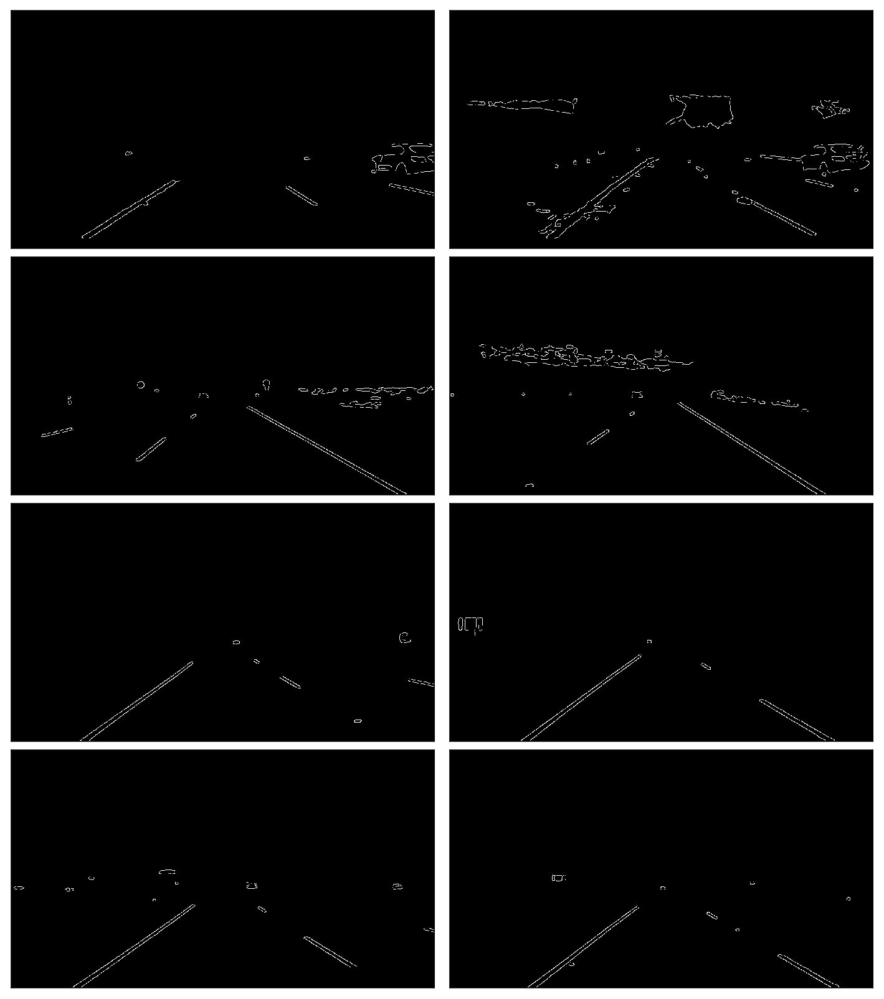

In [78]:
edged_images = list(map(lambda image: edge_detection(image), smooth_images))
display_images(edged_images)

## Finding region of interest

#### We need to fix our region of interest only to the road. Note that if we cut out an area in the form of a trapezium, we can get just the road. This can be done using the cv2.fillPoly() function (reference: https://docs.opencv.org/3.0-beta/modules/imgproc/doc/drawing_functions.html#fillpoly). The vertices of the trapezium is found using trial and error and rough estimation

In [80]:
# Creating the mask of the filtered region
def select_mask(image, vertices):
    mask = np.zeros_like(image) # Empty copy of the image
    if len(mask.shape)==2:
        cv2.fillPoly(mask, vertices, 255)
    else: # in case, the input image has a channel dimension
        cv2.fillPoly(mask, vertices, (255,)*mask.shape[2])        
    return cv2.bitwise_and(image, mask)

In [82]:
# Selecting the region of interest
def select_region(image):
    rows, cols = image.shape[:2]
    bottom_left = [cols*0.1, rows*0.95]
    top_left = [cols*0.4, rows*0.6]
    bottom_right = [cols*0.9, rows*0.95]
    top_right = [cols*0.6, rows*0.6] 
    # the vertices are an array of polygons (i.e array of arrays) and the data type must be integer
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    return select_mask(image, vertices)

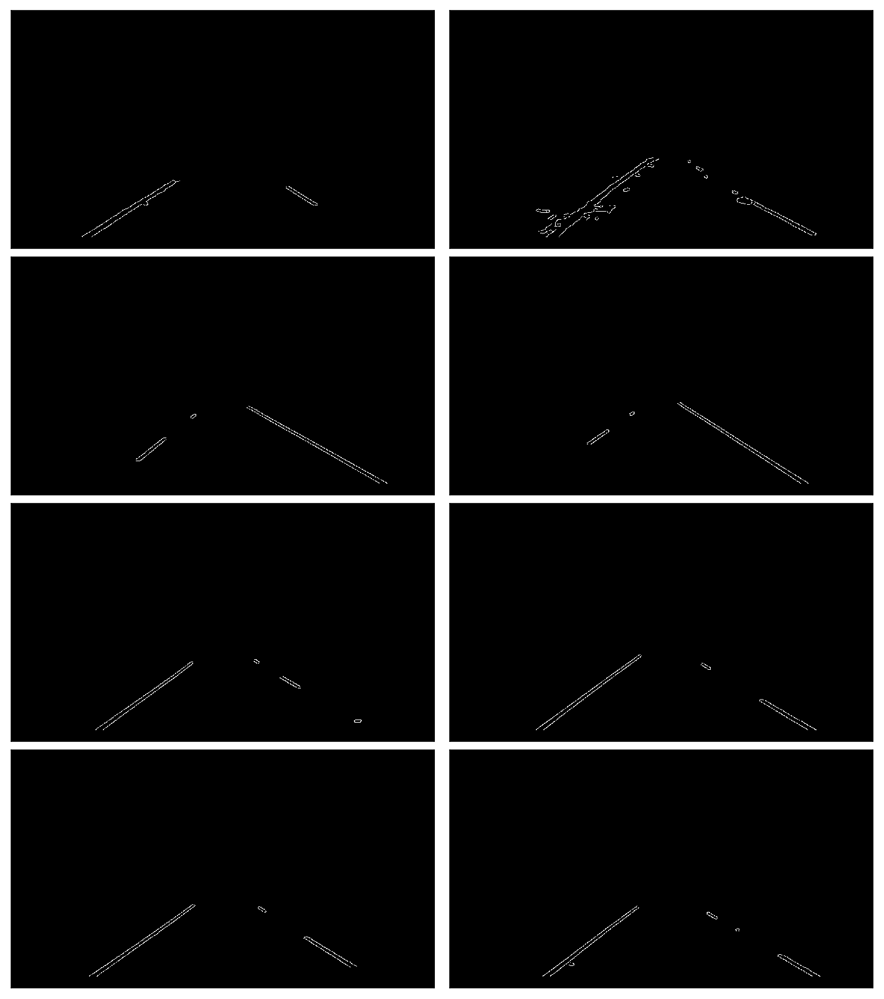

In [84]:
roi_images = list(map(select_region, edged_images))
display_images(roi_images)

## Hough Line Transforms

#### Hough Line Transforms are used to find lines in a binary image using the standard Hough transform.
#### Refer the following links for more details:
#### https://en.wikipedia.org/wiki/Hough_transform
#### https://docs.opencv.org/3.0-beta/modules/imgproc/doc/feature_detection.html?highlight=cv2.houghlinesp#cv2.HoughLinesP

In [88]:
# The following function accepts an images with Canny edge detection
# It returns a list of lines detected
def hough_line_transforms(image):
    return cv2.HoughLinesP(image, rho=1, theta=np.pi/180, threshold=20, minLineLength=20, maxLineGap=300)

In [92]:
line_list = list(map(hough_line_transforms, roi_images))
print('List of lines detected:\n',line_list)

List of lines detected:
 [array([[[161, 513, 366, 385]],

       [[183, 512, 374, 388]],

       [[183, 513, 376, 388]],

       [[160, 512, 348, 395]],

       [[622, 402, 683, 441]],

       [[626, 398, 693, 438]],

       [[290, 433, 369, 384]],

       [[212, 495, 381, 386]],

       [[623, 403, 674, 436]]], dtype=int32), array([[[221, 501, 450, 335]],

       [[576, 376, 829, 505]],

       [[231, 501, 471, 333]],

       [[223, 508, 473, 333]],

       [[660, 425, 821, 510]],

       [[225, 500, 452, 335]],

       [[258, 501, 464, 340]],

       [[306, 443, 696, 436]],

       [[198, 451, 334, 475]],

       [[218, 513, 475, 333]],

       [[247, 513, 383, 377]],

       [[577, 377, 830, 506]],

       [[200, 501, 403, 402]],

       [[235, 463, 687, 431]],

       [[203, 457, 312, 463]],

       [[576, 378, 824, 510]],

       [[197, 455, 700, 438]],

       [[203, 502, 461, 353]],

       [[343, 428, 474, 336]],

       [[215, 505, 470, 333]],

       [[227, 486, 545, 344]],



#### We can see that about 5-12 lines were detected per image

In [94]:
# Drwaing the Hough Line Transforms on the images
def draw_lines(image, lines, color=[255, 0, 0], thickness=2, make_copy=True):
    # the lines returned by cv2.HoughLinesP has the shape (-1, 1, 4)
    if make_copy:
        image = np.copy(image) # making a copy of the original
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(image, (x1, y1), (x2, y2), color, thickness)
    return image

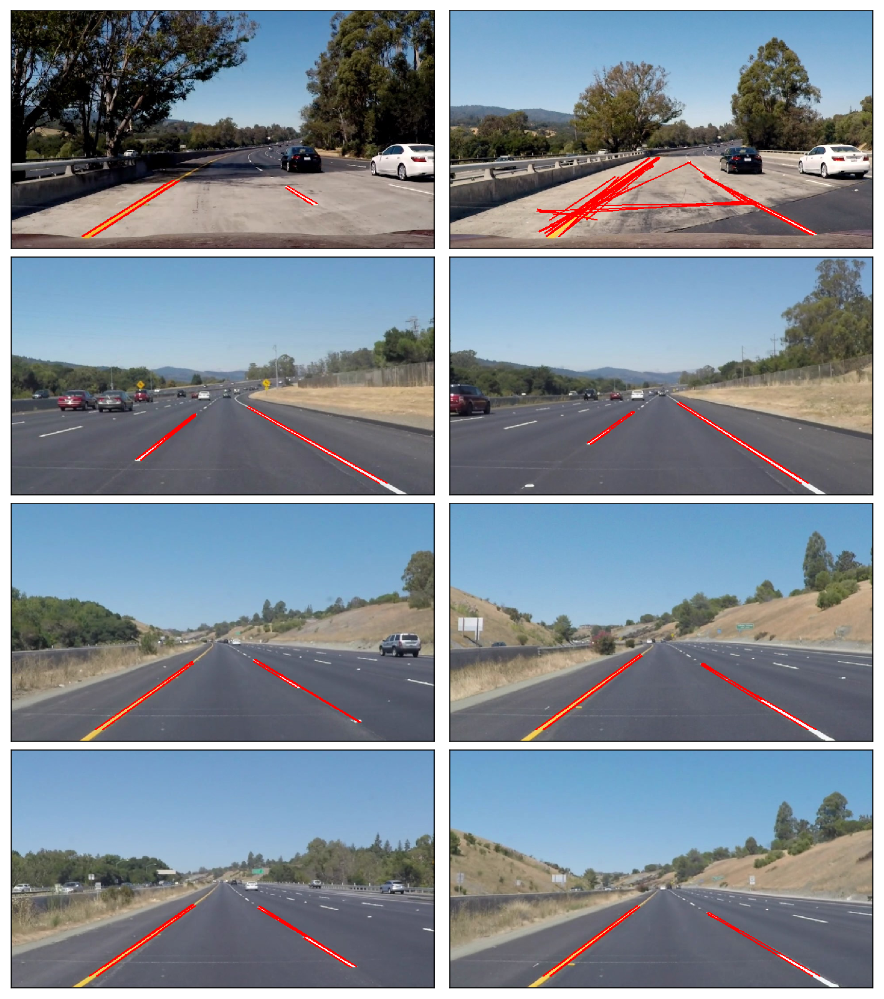

In [97]:
line_images = []
for image, lines in zip(test_images, line_list):
    line_images.append(draw_lines(image, lines))

display_images(line_images)

## Averaging and Extrapolating the Lines

##### The above result has 2 faults:
##### 1. There are multiple lines detected for a lane. We have to detect a sinle line per lane.
##### 2. Some lanes are only partially recognized. We have to extrapolate the line to cover full lane line length.
##### We should have 2 images, one for the left lane(positive slope), one for the right lane(negative slope). This is because the y coordinate is reversed in the image, i.e, the lower y value is actually higher in the image and vice-versa. 

In [99]:
def average_slope_intercept(lines):
    left_lines, right_lines = [], [] # (slope, intercept)
    left_weights, right_weights = [], [] # (length)
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x1 == x2: # ingnore a vertical line
                continue
            m = (y2 - y1) / (x2 - x1) # slope
            c = y1 - m * x1 # y-intercept
            dist = np.sqrt((y2 - y1) ** 2 + (x2 - x1) ** 2) # euclidean distance
            
            if m < 0: # slope is negative
                left_lines.append((m, c))
                left_weights.append((dist))
            else:
                right_lines.append((m, c))
                right_weights.append((dist))
    
    # adding weightage to longer lines
    left_lane  = np.dot(left_weights,  left_lines) /np.sum(left_weights)  if len(left_weights) >0 else None
    right_lane = np.dot(right_weights, right_lines)/np.sum(right_weights) if len(right_weights)>0 else None
    
    return left_lane, right_lane

In [101]:
# function to convert (slope, intercept) into coordinates
def make_line_coords(y1, y2, line):
    if line is None:
        return None
    m, c = line
    x1, x2 = int((y1 - c) / m), int((y2 - c) / m)
    y1, y2 = int(y1), int(y2)
    return ((x1, y1), (x2, y2))

In [106]:
def lane_lines(image, lines):
    left_lane, right_lane = average_slope_intercept(lines)
    y1 = image.shape[0] # bottom of the image
    y2 = y1 * 0.6 # middle (a bit lower)
    left_line  = make_line_coords(y1, y2, left_lane)
    right_line = make_line_coords(y1, y2, right_lane)
    return left_line, right_line

In [107]:
def draw_lane_lines(image, lines, color=[255, 0, 0], thickness=20):
    # make a separate image to draw lines and combine with the orignal later
    line_image = np.zeros_like(image)
    for line in lines:
        if line is not None:
            cv2.line(line_image, *line,  color, thickness)
    # image1 * α + image2 * β + λ
    # image1 and image2 must be the same shape.
    return cv2.addWeighted(image, 1.0, line_image, 0.95, 0.0)

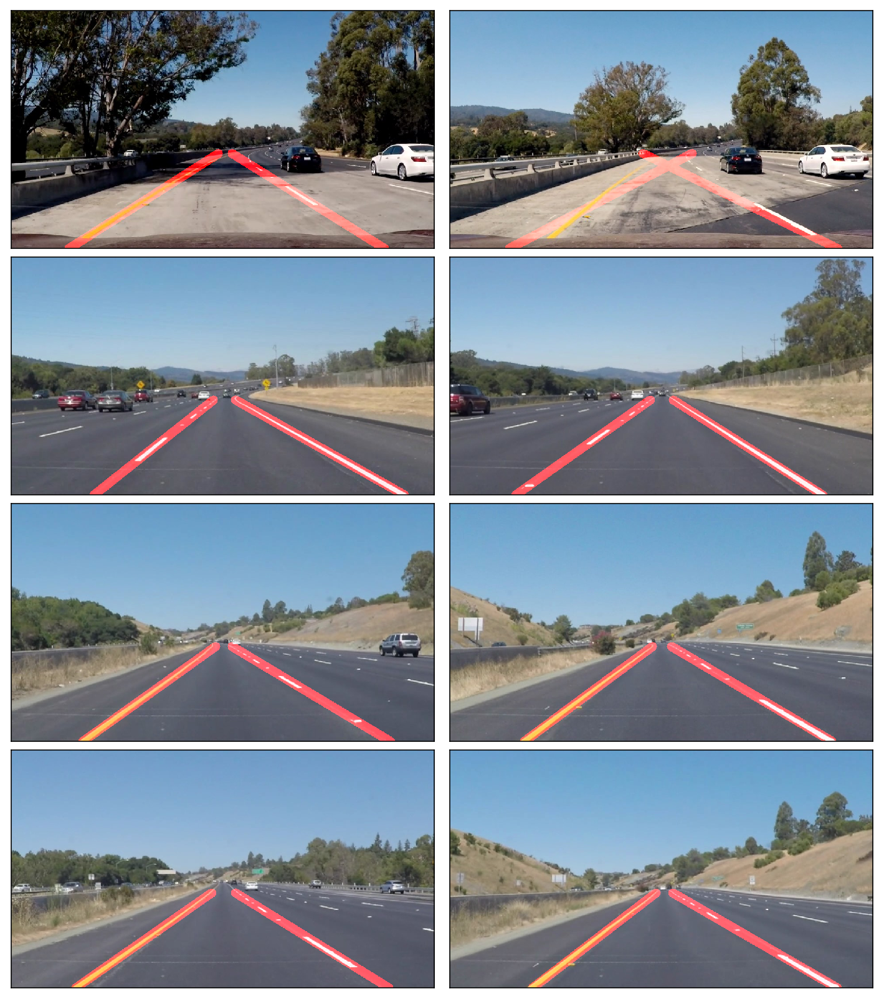

In [109]:
lane_images = []
for image, lines in zip(test_images, line_list):
    lane_images.append(draw_lane_lines(image, lane_lines(image, lines)))

    
display_images(lane_images)